# Drone Landing

This study is about image segmentation task based on U-Net algorith using Tensorflow2 and Keras. After segmentation the results will be used for decide where to land the drone.


## Library Implementation

In [74]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os, glob,sys
from os import listdir

## Data Fetching

In [75]:
dataset = pd.read_csv('/kaggle/input/drone-landing-data/drone_landing_data/class_dict_seg.csv')
dataset

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87
5,water,28,42,168
6,rocks,48,41,30
7,pool,0,50,89
8,vegetation,107,142,35
9,roof,70,70,70


# Load and Preprocess Data

In [77]:
import tensorflow as tf
import numpy as np
import os
import re
import pandas as pd

# Load and correct the CSV columns
class_dict_path = '/kaggle/input/drone-landing-data/drone_landing_data/class_dict_seg.csv'
class_dict = pd.read_csv(class_dict_path)
class_dict.columns = class_dict.columns.str.strip()  
print(class_dict.columns)  

def load_data(data_path, img_size, batch_size):
    def parse_image(filename):
        image = tf.io.read_file(filename)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, img_size)
        image = image / 255.0  # Normalize to [0, 1]
        return image

    def parse_mask(filename):
        mask = tf.io.read_file(filename)
        mask = tf.image.decode_png(mask, channels=3)
        mask = tf.image.resize(mask, img_size)
        mask = tf.py_function(map_rgb_to_class, [mask], tf.uint8)
        mask.set_shape(img_size + (1,))  # mask has shape (256, 256, 1)
        return mask

    def map_rgb_to_class(mask):
        mask = mask.numpy()
        shape = mask.shape
        new_mask = np.zeros((shape[0], shape[1]), dtype=np.uint8)
        for i, row in class_dict.iterrows():
            r, g, b = row['r'], row['g'], row['b']
            class_index = i
            matches = (mask[:, :, 0] == r) & (mask[:, :, 1] == g) & (mask[:, :, 2] == b)
            new_mask[matches] = class_index
        return new_mask[..., np.newaxis]  

    def augment(image, mask):
        # Random rotation
        angle = tf.random.uniform([], -30, 30, dtype=tf.float32)
        image = tf.image.rot90(image, tf.cast(angle // 90, tf.int32))
        mask = tf.image.rot90(mask, tf.cast(angle // 90, tf.int32))
        
        # Random crop
        mask = tf.cast(mask, tf.float32)  
        combined = tf.concat([image, mask], axis=-1)
        combined = tf.image.resize_with_crop_or_pad(combined, img_size[0] + 30, img_size[1] + 30)
        combined = tf.image.random_crop(combined, size=[img_size[0], img_size[1], 4])
        image, mask = combined[..., :3], combined[..., 3:]
        
        # Random brightness adjustment
        image = tf.image.random_brightness(image, max_delta=0.2)
        
        mask = tf.cast(mask, tf.uint8) 
        
        return image, mask

    original_images_path = os.path.join(data_path, 'original_images')
    masks_path = os.path.join(data_path, 'RGB_color_image_masks')

    # Collect images and masks filenames
    image_filenames = sorted([f for f in os.listdir(original_images_path) if f.endswith('.jpg')], key=lambda x: int(re.findall(r'\d+', x)[0]))
    mask_filenames = sorted([f for f in os.listdir(masks_path) if f.endswith('.png')], key=lambda x: int(re.findall(r'\d+', x)[0]))

    # Create pairs
    image_mask_pairs = [(os.path.join(original_images_path, img), os.path.join(masks_path, img.replace('.jpg', '.png'))) for img in image_filenames if img.replace('.jpg', '.png') in mask_filenames]

    original_images = [pair[0] for pair in image_mask_pairs]
    masks = [pair[1] for pair in image_mask_pairs]

    dataset = tf.data.Dataset.from_tensor_slices((original_images, masks))
    dataset = dataset.shuffle(buffer_size=len(original_images))
    dataset = dataset.map(lambda x, y: (parse_image(x), parse_mask(y)), num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    augmented_dataset = dataset.map(lambda x, y: augment(x, y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
    combined_dataset = dataset.concatenate(augmented_dataset)
    
    combined_dataset = combined_dataset.batch(batch_size)
    combined_dataset = combined_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return combined_dataset

# Example usage
data_path = '/kaggle/input/drone-landing-data/drone_landing_data'
img_size = (256, 256)
batch_size = 8
dataset = load_data(data_path, img_size, batch_size)
dataset


Index(['name', 'r', 'g', 'b'], dtype='object')


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.uint8, name=None))>

In [92]:

# Split the dataset into training and validation sets
dataset_size = sum(1 for _ in dataset)
train_size = int(0.8 * dataset_size)  # 80% for training
val_size = dataset_size - train_size  # 20% for validation

train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)
buffer_size = 1000

train_dataset = train_dataset.cache().shuffle(buffer_size).repeat()
val_dataset = val_dataset.repeat()

In [ ]:
import matplotlib.pyplot as plt
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ["Input Image", "True Mask", "Predicted Mask"]

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis("off")
  plt.show()

In [ ]:
sample_batch = next(iter(train_dataset))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
display([sample_image, sample_mask])

# Segmentation Models

**U-Net**

In [132]:
import tensorflow as tf
from tensorflow.keras import layers, models

def create_unet_model(input_shape, num_classes=23):
    inputs = tf.keras.Input(shape=input_shape)
    
    # Encoder: Contracting Path
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)
    
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    
    # Decoder: Expanding Path
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)
    
    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)
    
    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)
    
    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)
    
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(c9)
    
    model = models.Model(inputs, outputs)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

input_shape = (256, 256, 3)
num_classes = 23
unet_model = create_unet_model(input_shape, num_classes)
unet_model.summary()

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_211 (Conv2D) │ (None, 256, 256,  │      1,792 │ input_layer_21[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_212 (Conv2D) │ (None, 256, 256,  │     36,928 │ conv2d_211[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_28    │ (None, 128, 128,  │          0 │ conv2d_212[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_213 (Conv2D) │ (None, 128, 128,  │     73,856 │ max_pooling2d_28… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_214 (Conv2D) │ (None, 128, 128,  │    147,584 │ conv2d_213[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_29    │ (None, 64, 64,    │          0 │ conv2d_214[0][0]  │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_215 (Conv2D) │ (None, 64, 64,    │    295,168 │ max_pooling2d_29… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_216 (Conv2D) │ (None, 64, 64,    │    590,080 │ conv2d_215[0][0]  │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_30    │ (None, 32, 32,    │          0 │ conv2d_216[0][0]  │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_217 (Conv2D) │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_30… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_218 (Conv2D) │ (None, 32, 32,    │  2,359,808 │ conv2d_217[0][0]  │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_31    │ (None, 16, 16,    │          0 │ conv2d_218[0][0]  │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_219 (Conv2D) │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_31… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_220 (Conv2D) │ (None, 16, 16,    │  9,438,208 │ conv2d_219[0][0]  │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_93 │ (None, 32, 32,    │  2,097,664 │ conv2d_220[0][0]  │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_80      │ (None, 32, 32,    │          0 │ conv2d_transpose

 Total params: 31,033,175 (118.38 MB)

 Trainable params: 31,033,175 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

In [79]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, concatenate, Activation, BatchNormalization
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam

def dice_coef(y_true, y_pred):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + 1)

def unet_with_resnet(num_classes, input_shape, resnet_weight_path=None):
    img_input = Input(input_shape)

    # Load ResNet50 with pretrained weights
    resnet_base = ResNet50(weights=resnet_weight_path, include_top=False, input_tensor=img_input)

    # Make ResNet layers non-trainable
    for layer in resnet_base.layers:
        layer.trainable = True

    # Encoder
    block_1_out = resnet_base.get_layer("conv1_relu").output
    block_2_out = resnet_base.get_layer("conv2_block3_out").output
    block_3_out = resnet_base.get_layer("conv3_block4_out").output
    block_4_out = resnet_base.get_layer("conv4_block6_out").output
    block_5_out = resnet_base.get_layer("conv5_block3_out").output

    # Decoder
    # UP 1
    x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(block_5_out)
    x = concatenate([x, block_4_out])
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 2
    x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x)
    x = concatenate([x, block_3_out])
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 3
    x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x)
    x = concatenate([x, block_2_out])
    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 4
    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = concatenate([x, block_1_out])
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Last upsampling to match the input size
    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Last conv
    x = Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(x)

    model = Model(inputs=img_input, outputs=x)

    model.compile(Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=[dice_coef])

    return model

resnet_unet = unet_with_resnet(num_classes=23, input_shape=(256, 256, 3), resnet_weight_path='imagenet')

resnet_unet.summary()


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_14[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 37,894,487 (144.56 MB)

 Trainable params: 37,839,319 (144.35 MB)

 Non-trainable params: 55,168 (215.50 KB)

# U-Net with ResNET Backbone Training

In [93]:
# Training Parameters
num_epochs = 20
STEPS_PER_EPOCH1 = train_size // batch_size
STEPS_PER_EPOCH
VALIDATION_STEPS1 = val_size // batch_size
VALIDATION_STEPS1

1

In [94]:
import time
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, Callback

import matplotlib.pyplot as plt
'''
class ImageMaskCallback(Callback):
    def __init__(self, dataset, model, output_dir='output_images', num_images=1):
        super().__init__()
        self.dataset = dataset
        self.model = model
        self.output_dir = output_dir
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        for images, masks in self.dataset.take(self.num_images):
            predictions = self.model.predict(images)
            for i in range(self.num_images):
                self.display_images(epoch, i, images[i], masks[i], predictions[i])

    def display_images(self, epoch, index, image, true_mask, pred_mask):
        true_mask = tf.argmax(true_mask, axis=-1)
        pred_mask = tf.argmax(pred_mask, axis=-1)
        
        fig, ax = plt.subplots(1, 3, figsize=(20, 10))
        ax[0].imshow(image)
        ax[0].set_title('Original Image')

        ax[1].imshow(true_mask)
        ax[1].set_title('Ground Truth Mask')

        ax[2].imshow(pred_mask)
        ax[2].set_title('Predicted Mask')

        plt.suptitle(f'Epoch {epoch+1} - Image {index+1}')
        plt.savefig(f'{self.output_dir}/epoch_{epoch+1}_image_{index+1}.png')
        plt.show()
'''
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name=None, dtype=None):
        super().__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        y_true = tf.squeeze(y_true, axis=-1) 
        return super().update_state(y_true, y_pred, sample_weight)

def dice_coefficient(y_true, y_pred):
    y_true = tf.cast(tf.squeeze(y_true, axis=-1), tf.float32) 
    y_pred = tf.cast(tf.argmax(y_pred, axis=-1), tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true + y_pred)
    return (2 * intersection + 1) / (union + 1)

def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 ** (epoch / s)
    return exponential_decay_fn

def train_model(model, train_data, val_data, STEPS_PER_EPOCH1, VALIDATION_STEPS1, epochs=150, batch_size=64, initial_learning_rate=1e-4):
    checkpoint_callback = ModelCheckpoint(
        filepath='unet_model.keras',
        save_best_only=True,
        monitor='val_loss',
        mode='auto',
        verbose=1
    )
    earlystop_callback = EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=30,
        mode='auto',
        verbose=1,
        restore_best_weights=True
    )

    exponential_decay_fn = exponential_decay(initial_learning_rate, 50)
    lr_scheduler = LearningRateScheduler(
        exponential_decay_fn,
        verbose=1
    )

    #time_limit_callback = TimeLimitCallback(max_seconds_per_epoch=300)

    #image_mask_callback = ImageMaskCallback(val_data, model, output_dir='output_images', num_images=1)

    
    iou_metric = MeanIoU(num_classes=23)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_learning_rate), 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy', iou_metric, dice_coefficient])
    
    history = model.fit(train_data, 
                        validation_data=val_data, 
                        epochs=epochs, 
                        batch_size=batch_size,
                        steps_per_epoch=STEPS_PER_EPOCH1,
                        validation_steps=VALIDATION_STEPS1,
                        callbacks=[checkpoint_callback, earlystop_callback ,lr_scheduler])
    return history
model = unet_with_resnet(num_classes=23, input_shape=(256, 256, 3), resnet_weight_path='imagenet')
#model = create_unet_model(input_shape, num_classes)

input_shape = (256, 256, 3)
num_classes = 23

# Train the model
history = train_model(model, train_dataset, val_dataset, STEPS_PER_EPOCH1, VALIDATION_STEPS1, epochs=100, batch_size=8, initial_learning_rate=1e-4)



Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - accuracy: 0.0320 - dice_coefficient: 6.6939 - loss: 3.3989 - mean_io_u_10: 0.0093
Epoch 1: val_loss improved from inf to 3.25424, saving model to unet_model.keras
5/5 ━━━━━━━━━━━━━━━━━━━━ 185s 18s/step - accuracy: 0.0325 - dice_coefficient: 6.7359 - loss: 3.3948 - mean_io_u_10: 0.0094 - val_accuracy: 0.0222 - val_dice_coefficient: 7.8574 - val_loss: 3.2542 - val_mean_io_u_10: 0.0046 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.549925860214361e-05.
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.0505 - dice_coefficient: 7.4562 - loss: 3.2561 - mean_io_u_10: 0.0131
Epoch 2: val_loss did not improve from 3.25424
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - accuracy: 0.0511 - dice_coefficient: 7.4382 - loss: 3.2507 - mean_io_u_10: 0.0132 - val_accuracy: 0.0130 - val_dice_coefficient: 6.2964 - val_loss: 3.2727 - val_mean

# Moidified U-Net Training

In [115]:
import time
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, Callback

import matplotlib.pyplot as plt
'''
class ImageMaskCallback(Callback):
    def __init__(self, dataset, model, output_dir='output_images', num_images=1):
        super().__init__()
        self.dataset = dataset
        self.model = model
        self.output_dir = output_dir
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        for images, masks in self.dataset.take(self.num_images):
            predictions = self.model.predict(images)
            for i in range(self.num_images):
                self.display_images(epoch, i, images[i], masks[i], predictions[i])

    def display_images(self, epoch, index, image, true_mask, pred_mask):
        true_mask = tf.argmax(true_mask, axis=-1)
        pred_mask = tf.argmax(pred_mask, axis=-1)
        
        fig, ax = plt.subplots(1, 3, figsize=(20, 10))
        ax[0].imshow(image)
        ax[0].set_title('Original Image')

        ax[1].imshow(true_mask)
        ax[1].set_title('Ground Truth Mask')

        ax[2].imshow(pred_mask)
        ax[2].set_title('Predicted Mask')

        plt.suptitle(f'Epoch {epoch+1} - Image {index+1}')
        plt.savefig(f'{self.output_dir}/epoch_{epoch+1}_image_{index+1}.png')
        plt.show()
'''
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name=None, dtype=None):
        super().__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        y_true = tf.squeeze(y_true, axis=-1)  
        return super().update_state(y_true, y_pred, sample_weight)

def dice_coefficient(y_true, y_pred):
    y_true = tf.cast(tf.squeeze(y_true, axis=-1), tf.float32) 
    y_pred = tf.cast(tf.argmax(y_pred, axis=-1), tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true + y_pred)
    return (2 * intersection + 1) / (union + 1)

def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 ** (epoch / s)
    return exponential_decay_fn

def train_model(model, train_data, val_data, STEPS_PER_EPOCH1, VALIDATION_STEPS1, epochs=150, batch_size=64, initial_learning_rate=1e-4):
    checkpoint_callback = ModelCheckpoint(
        filepath='unet_model_unet.keras',
        save_best_only=True,
        monitor='val_loss',
        mode='auto',
        verbose=1
    )
    earlystop_callback = EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=30,
        mode='auto',
        verbose=1,
        restore_best_weights=True
    )

    exponential_decay_fn = exponential_decay(initial_learning_rate, 50)
    lr_scheduler = LearningRateScheduler(
        exponential_decay_fn,
        verbose=1
    )

    #time_limit_callback = TimeLimitCallback(max_seconds_per_epoch=300)

    #image_mask_callback = ImageMaskCallback(val_data, model, output_dir='output_images', num_images=1)

    
    iou_metric = MeanIoU(num_classes=23)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_learning_rate), 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy', iou_metric, dice_coefficient])
    
    history = model.fit(train_data, 
                        validation_data=val_data, 
                        epochs=epochs, 
                        batch_size=batch_size,
                        steps_per_epoch=STEPS_PER_EPOCH1,
                        validation_steps=VALIDATION_STEPS1,
                        callbacks=[checkpoint_callback, earlystop_callback ,lr_scheduler])
    return history
#model = unet_with_resnet(num_classes=23, input_shape=(256, 256, 3), resnet_weight_path='imagenet')
model = create_unet_model(input_shape, num_classes)

input_shape = (256, 256, 3)
num_classes = 23

# Train the model
history = train_model(model, train_dataset, val_dataset, STEPS_PER_EPOCH1, VALIDATION_STEPS1, epochs=100, batch_size=8, initial_learning_rate=1e-4)



Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.1553 - dice_coefficient: 6.0406 - loss: 3.0874 - mean_io_u_11: 0.0150
Epoch 1: val_loss improved from inf to 2.99551, saving model to unet_model_unet.keras
5/5 ━━━━━━━━━━━━━━━━━━━━ 147s 18s/step - accuracy: 0.1747 - dice_coefficient: 5.8678 - loss: 3.0819 - mean_io_u_11: 0.0160 - val_accuracy: 0.3134 - val_dice_coefficient: 2.8550 - val_loss: 2.9955 - val_mean_io_u_11: 0.0180 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.549925860214361e-05.
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.3567 - dice_coefficient: 2.2707 - loss: 2.9316 - mean_io_u_11: 0.0185
Epoch 2: val_loss improved from 2.99551 to 2.66996, saving model to unet_model_unet.keras
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 925ms/step - accuracy: 0.3601 - dice_coefficient: 2.2589 - loss: 2.9219 - mean_io_u_11: 0.0185 - val_accuracy: 0.4093 - val_dice_c

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 564ms/step - accuracy: 0.4248 - dice_coefficient: 1.6856 - loss: 2.7142 - mean_io_u_11: 0.0201 - val_accuracy: 0.4571 - val_dice_coefficient: 1.6885 - val_loss: 2.4812 - val_mean_io_u_11: 0.0213 - learning_rate: 9.1201e-05

Epoch 4: LearningRateScheduler setting learning rate to 8.709635899560807e-05.
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3703 - dice_coefficient: 1.6880 - loss: 2.6642 - mean_io_u_11: 0.0168
Epoch 4: val_loss improved from 2.48115 to 2.35233, saving model to unet_model_unet.keras
5/5 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 0.3634 - dice_coefficient: 1.6836 - loss: 2.6739 - mean_io_u_11: 0.0164 - val_accuracy: 0.5347 - val_dice_coefficient: 1.5956 - val_loss: 2.3523 - val_mean_io_u_11: 0.0250 - learning_rate: 8.7096e-05

Epoch 5: LearningRateScheduler setting learning rate to 8.31763771102671e-05.
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3074 - dice_coefficient: 1.6550 - loss: 2.7195 - mean_io_

# Results of U-NET with ResNet Backbone

In [117]:
def display_learning_curves(history):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]

    loss = history.history["loss"]
    val_loss = history.history["val_loss"]

    epochs_range = range(52)

    fig = plt.figure(figsize=(12,6))

    plt.subplot(1,2,1)
    plt.plot(epochs_range, acc, label="train accuracy")
    plt.plot(epochs_range, val_acc, label="validataion accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")

    plt.subplot(1,2,2)
    plt.plot(epochs_range, loss, label="train loss")
    plt.plot(epochs_range, val_loss, label="validataion loss")
    plt.title("Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc="upper right")

    fig.tight_layout()
    plt.show()

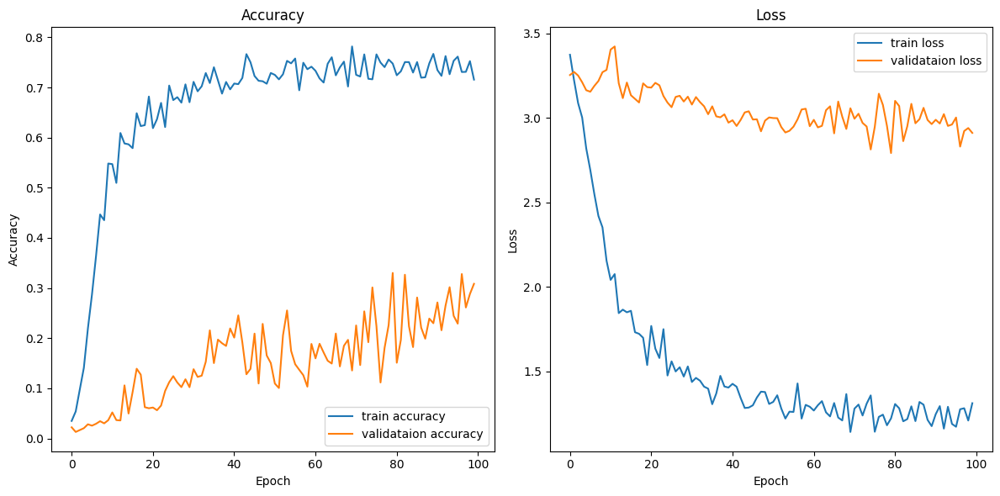

In [113]:
# Display learning curves of U-Net with Res-Net Backbone
display_learning_curves(model.history)

In [101]:
import matplotlib.pyplot as plt

def generate_predictions(model, dataset, num_samples):
    data_iter = iter(dataset)
    original_images, true_masks = next(data_iter)

    # Generate predictions
    pred_masks = model.predict(original_images)

    # Convert predicted masks from one-hot to class indices
    pred_masks = tf.argmax(pred_masks, axis=-1)
    pred_masks = pred_masks[..., tf.newaxis]  

    return original_images, true_masks, pred_masks

def plot_segmentation_results(original_images, true_masks, pred_masks, num_samples):
    plt.figure(figsize=(20, num_samples * 5))

    for i in range(num_samples):
        # Original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(original_images[i])
        plt.title("Original Image")
        plt.axis("off")

        # Ground truth mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(tf.squeeze(true_masks[i], axis=-1), cmap='viridis')
        plt.title("Ground Truth Mask")
        plt.axis("off")

        # Predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(tf.squeeze(pred_masks[i], axis=-1), cmap='viridis')
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


num_samples = 5  # Number of samples to visualize


In [125]:
test_dataaset = dataset.skip(train_size)

11/11 ━━━━━━━━━━━━━━━━━━━━ 131s 909ms/step - accuracy: 0.6724 - loss: 1.5002
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


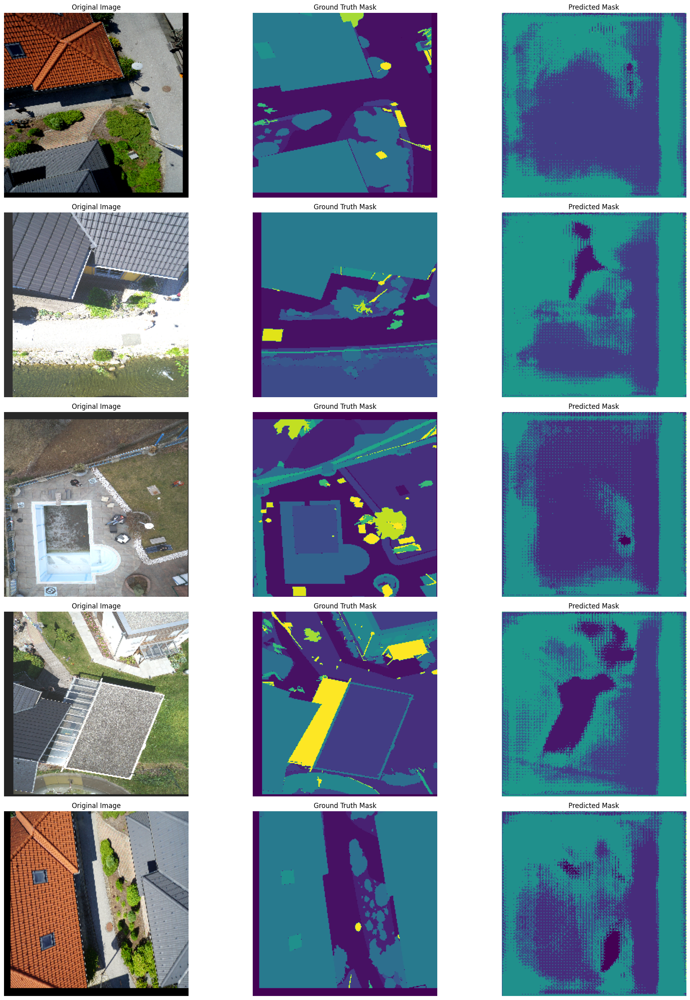

In [129]:
# Load the best model
best_model = tf.keras.models.load_model('unet_model.keras', compile=False)
best_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                   loss='sparse_categorical_crossentropy', 
                   metrics=['accuracy'])

# Evaluate the best model
sengmentation_output = best_model.fit(test_dataset)

# Generate predictions and plot results
original_images, true_masks, pred_masks = generate_predictions(best_model, val_dataset, num_samples)
plot_segmentation_results(original_images, true_masks, pred_masks, num_samples)


# Post Processing and Classification

In [130]:
import numpy as np
from skimage import measure

class_labels = {
    0: 'paved-area',
    1: 'dirt',
    2: 'grass',
    3: 'gravel',
    4: 'water',
    5: 'rocks',
    6: 'pool',
    7: 'vegetation',
    8: 'roof',
    9: 'wall',
    10: 'window',
    11: 'door',
    12: 'fence',
    13: 'fence-pole',
    14: 'person',
    15: 'dog',
    16: 'car',
    17: 'bicycle',
    18: 'tree',
    19: 'bald-tree',
    20: 'ar-marker',
    21: 'obstacle',
    22: 'conflicting'
}

def classify_segments(segmentation_output):
    classification_result = []
    
    for i in range(segmentation_output.shape[0]):
        segmented_image = segmentation_output[i]
        
        # Initialize a dictionary to store classified regions
        classified_regions = {class_label: [] for class_label in class_labels.values()}
        
        # Process each class separately
        for class_index, class_name in class_labels.items():
            # Create a binary mask for the current class
            class_mask = (segmented_image == class_index).astype(np.uint8)
            
            # Label connected regions for the current class
            labeled_regions = measure.label(class_mask, connectivity=2)
            
            # Find properties of labeled regions
            region_props = measure.regionprops(labeled_regions)
            
            # Store the regions in the classification result
            for region in region_props:
                classified_regions[class_name].append(region)
        
    classification_result.append(classified_regions)
    
    return classification_result

segmentation_output = np.squeeze(pred_masks, axis=-1) 
classification_result = classify_segments(segmentation_output)

# Print the classified regions for the first image in the batch
for class_name, regions in classification_result[0].items():
    print(f"Class: {class_name}, Number of Regions: {len(regions)}")


Class: paved-area, Number of Regions: 0
Class: dirt, Number of Regions: 1
Class: grass, Number of Regions: 41
Class: gravel, Number of Regions: 657
Class: water, Number of Regions: 143
Class: rocks, Number of Regions: 0
Class: pool, Number of Regions: 0
Class: vegetation, Number of Regions: 0
Class: roof, Number of Regions: 0
Class: wall, Number of Regions: 1302
Class: window, Number of Regions: 0
Class: door, Number of Regions: 0
Class: fence, Number of Regions: 0
Class: fence-pole, Number of Regions: 71
Class: person, Number of Regions: 0
Class: dog, Number of Regions: 1
Class: car, Number of Regions: 0
Class: bicycle, Number of Regions: 76
Class: tree, Number of Regions: 0
Class: bald-tree, Number of Regions: 0
Class: ar-marker, Number of Regions: 0
Class: obstacle, Number of Regions: 0
Class: conflicting, Number of Regions: 0


**Landing Coordination Results**

Best landing spot coordinates: [156 129]


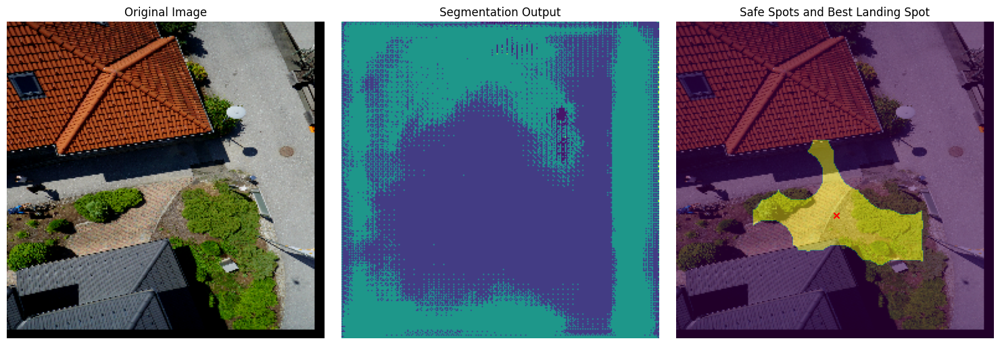

In [131]:
import numpy as np
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt

def safe_landing_criteria(segmentation_output, class_labels, distance_threshold=20):
    # Convert segmentation output to binary masks for dangerous areas
    dangerous_classes = ['water', 'rocks', 'pool', 'roof', 'wall', 'window', 'door', 'fence', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'obstacle']
    dangerous_indices = [index for index, name in class_labels.items() if name in dangerous_classes]

    safe_mask = np.ones(segmentation_output.shape[:2], dtype=np.uint8)

    for index in dangerous_indices:
        dangerous_mask = (segmentation_output == index).astype(np.uint8)
        safe_mask = np.logical_and(safe_mask, np.logical_not(dangerous_mask))

    # Distance transform to find the safest spots
    distance = distance_transform_edt(safe_mask)
    safe_spots = distance >= distance_threshold

    return safe_spots, distance

def choose_best_landing_spot(safe_spots, distance):
    if not np.any(safe_spots):
        raise ValueError("No safe spots identified. Please adjust the criteria or threshold.")

    # Identify the safest spot based on the maximum distance from dangerous areas
    max_distance = np.max(distance[safe_spots])
    best_spot = np.argwhere(distance == max_distance)[0]  # Get the coordinates of the best spot
    return best_spot

def plot_landing_spots(original_image, segmentation_output, safe_spots, best_spot):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(segmentation_output, cmap='viridis')
    plt.title("Segmentation Output")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(original_image)
    plt.imshow(safe_spots, cmap='viridis', alpha=0.5)
    plt.scatter([best_spot[1]], [best_spot[0]], color='red', marker='x')
    plt.title("Safe Spots and Best Landing Spot")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


segmentation_output = np.squeeze(pred_masks, axis=-1)  
safe_spots, distance = safe_landing_criteria(segmentation_output[0], class_labels, distance_threshold=20)
try:
    best_spot = choose_best_landing_spot(safe_spots, distance)
    print(f"Best landing spot coordinates: {best_spot}")
    plot_landing_spots(original_images[0], segmentation_output[0], safe_spots, best_spot)
except ValueError as e:
    print(e)


# Results of Modified U-Net

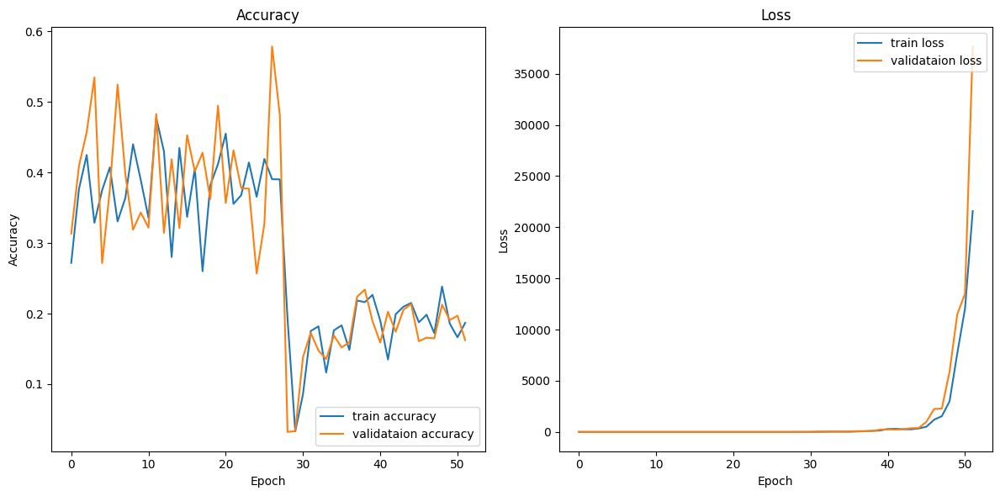

In [118]:
display_learning_curves(model.history)

In [122]:
# Create a dataset for training
test_dataset = dataset.skip(train_size)

11/11 ━━━━━━━━━━━━━━━━━━━━ 83s 951ms/step - accuracy: 0.4151 - loss: 2.2055
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


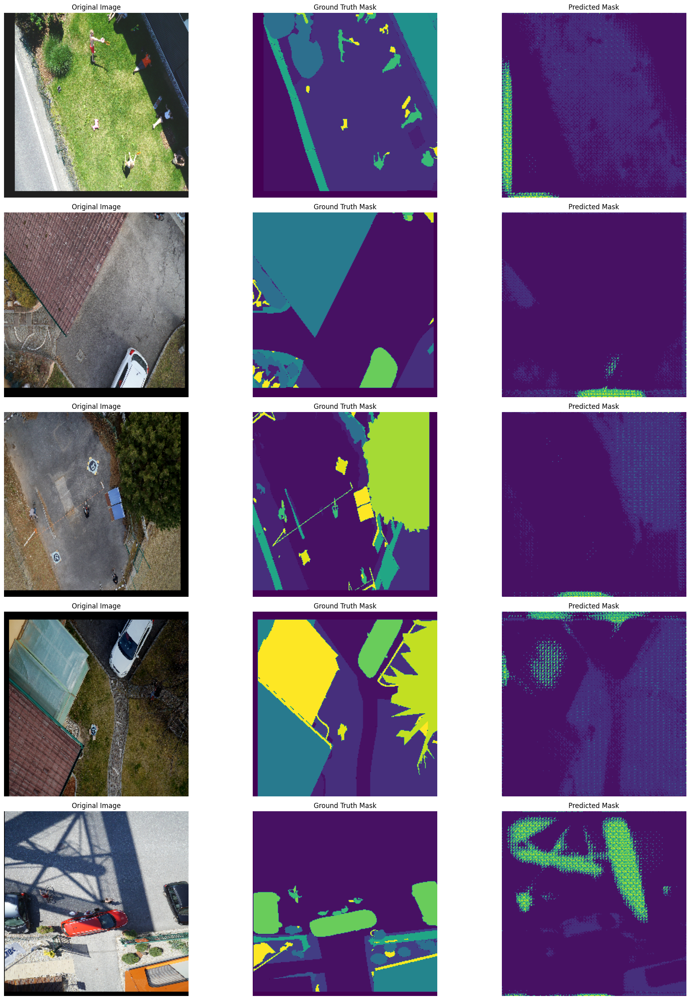

In [120]:
# Load the best model
best_model = tf.keras.models.load_model('unet_model_unet.keras', compile=False)
best_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                   loss='sparse_categorical_crossentropy', 
                   metrics=['accuracy'])

# Evaluate the best model
sengmentation_output = best_model.fit(test_dataset)

# Generate predictions and plot results
original_images, true_masks, pred_masks = generate_predictions(best_model, val_dataset, num_samples)
plot_segmentation_results(original_images, true_masks, pred_masks, num_samples)


In [123]:
import numpy as np
from skimage import measure

class_labels = {
    0: 'paved-area',
    1: 'dirt',
    2: 'grass',
    3: 'gravel',
    4: 'water',
    5: 'rocks',
    6: 'pool',
    7: 'vegetation',
    8: 'roof',
    9: 'wall',
    10: 'window',
    11: 'door',
    12: 'fence',
    13: 'fence-pole',
    14: 'person',
    15: 'dog',
    16: 'car',
    17: 'bicycle',
    18: 'tree',
    19: 'bald-tree',
    20: 'ar-marker',
    21: 'obstacle',
    22: 'conflicting'
}

def classify_segments(segmentation_output):
    classification_result = []
    
    for i in range(segmentation_output.shape[0]):
        segmented_image = segmentation_output[i]
        
        # Initialize a dictionary to store classified regions
        classified_regions = {class_label: [] for class_label in class_labels.values()}
        
        # Process each class separately
        for class_index, class_name in class_labels.items():
            # Create a binary mask for the current class
            class_mask = (segmented_image == class_index).astype(np.uint8)
            
            # Label connected regions for the current class
            labeled_regions = measure.label(class_mask, connectivity=2)
            
            # Find properties of labeled regions
            region_props = measure.regionprops(labeled_regions)
            
            # Store the regions in the classification result
            for region in region_props:
                classified_regions[class_name].append(region)
        
    classification_result.append(classified_regions)
    
    return classification_result


segmentation_output = np.squeeze(pred_masks, axis=-1)  
classification_result = classify_segments(segmentation_output)

# Print the classified regions for the first image in the batch
for class_name, regions in classification_result[0].items():
    print(f"Class: {class_name}, Number of Regions: {len(regions)}")



Class: paved-area, Number of Regions: 0
Class: dirt, Number of Regions: 50
Class: grass, Number of Regions: 70
Class: gravel, Number of Regions: 68
Class: water, Number of Regions: 1
Class: rocks, Number of Regions: 0
Class: pool, Number of Regions: 0
Class: vegetation, Number of Regions: 4
Class: roof, Number of Regions: 1
Class: wall, Number of Regions: 0
Class: window, Number of Regions: 0
Class: door, Number of Regions: 0
Class: fence, Number of Regions: 0
Class: fence-pole, Number of Regions: 0
Class: person, Number of Regions: 0
Class: dog, Number of Regions: 0
Class: car, Number of Regions: 0
Class: bicycle, Number of Regions: 0
Class: tree, Number of Regions: 0
Class: bald-tree, Number of Regions: 0
Class: ar-marker, Number of Regions: 0
Class: obstacle, Number of Regions: 0
Class: conflicting, Number of Regions: 0


Best landing spot coordinates: [ 19 255]


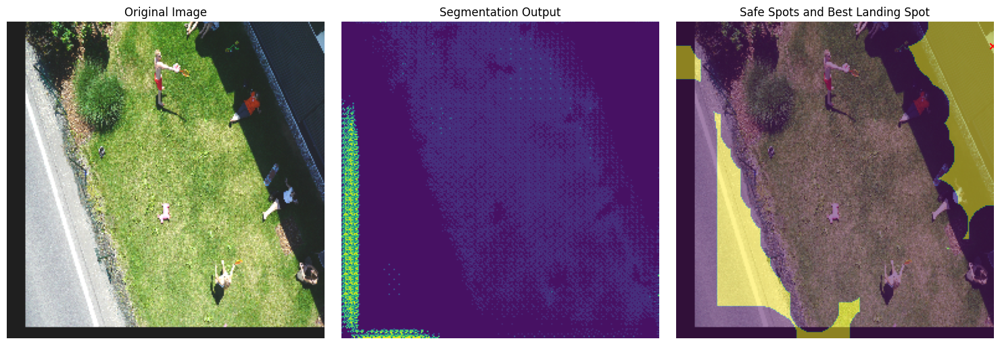

In [124]:
import numpy as np
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt

def safe_landing_criteria(segmentation_output, class_labels, distance_threshold=20):
    # Convert segmentation output to binary masks for dangerous areas
    dangerous_classes = ['water', 'rocks', 'pool', 'roof', 'wall', 'window', 'door', 'fence', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'obstacle']
    dangerous_indices = [index for index, name in class_labels.items() if name in dangerous_classes]

    safe_mask = np.ones(segmentation_output.shape[:2], dtype=np.uint8)

    for index in dangerous_indices:
        dangerous_mask = (segmentation_output == index).astype(np.uint8)
        safe_mask = np.logical_and(safe_mask, np.logical_not(dangerous_mask))

    # Distance transform to find the safest spots
    distance = distance_transform_edt(safe_mask)
    safe_spots = distance >= distance_threshold

    return safe_spots, distance

def choose_best_landing_spot(safe_spots, distance):
    if not np.any(safe_spots):
        raise ValueError("No safe spots identified. Please adjust the criteria or threshold.")

    # Identify the safest spot based on the maximum distance from dangerous areas
    max_distance = np.max(distance[safe_spots])
    best_spot = np.argwhere(distance == max_distance)[0]  # Get the coordinates of the best spot
    return best_spot

def plot_landing_spots(original_image, segmentation_output, safe_spots, best_spot):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(segmentation_output, cmap='viridis')
    plt.title("Segmentation Output")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(original_image)
    plt.imshow(safe_spots, cmap='viridis', alpha=0.5)
    plt.scatter([best_spot[1]], [best_spot[0]], color='red', marker='x')
    plt.title("Safe Spots and Best Landing Spot")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


segmentation_output = np.squeeze(pred_masks, axis=-1) 
safe_spots, distance = safe_landing_criteria(segmentation_output[0], class_labels, distance_threshold=20)
try:
    best_spot = choose_best_landing_spot(safe_spots, distance)
    print(f"Best landing spot coordinates: {best_spot}")
    plot_landing_spots(original_images[0], segmentation_output[0], safe_spots, best_spot)
except ValueError as e:
    print(e)
